In [1]:
import os
os.environ["SUNO_ENABLE_MPS"] = "True"
os.environ["SUNO_USE_SMALL_MODELS"] = "True"
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"]="1"
os.environ["SUNO_OFFLOAD_CPU"] = "False"

In [27]:
from audiobook import (
    describe_image, 
    chunk_text, 
    concatenate_audio_pydub, 
    make_page_reading, 
    make_page,
    Doc, 
    load_chapters_from_yaml,
    setup_tts,
    Page,
)

In [38]:
import os
import pprint
import pymupdf
from tqdm import tqdm
import torch
from bark import SAMPLE_RATE, generate_audio, preload_models
from scipy.io.wavfile import write as write_wav
from IPython.display import Audio, Image
import numpy as np


In [32]:
text_prompt = """
     Hello, my name is Suno. And, uh — and I like pizza. [laughs] 
     But I also have other interests such as playing tic tac toe.
"""

In [18]:
length_text = len(text_prompt)
length_generation_time = 100 #seconds
length_generation_time_b = 18.21 #seconds
gen_time_per_char = length_generation_time/length_text
gen_time_per_char_b = length_generation_time_b/length_text
print(f"Generation time per character: {gen_time_per_char:.2f} seconds")
print(f"Generation time per character: {gen_time_per_char_b:.2f} seconds")

Generation time per character: 0.75 seconds
Generation time per character: 0.14 seconds


In [12]:
# download and load all models
# preload_models()

# generate audio from text
voice_preset = "v2/en_speaker_6"
audio_array = generate_audio(text_prompt, history_prompt=voice_preset)

# save audio to disk
# write_wav("bark_generation.wav", SAMPLE_RATE, audio_array)

# play text in notebook
Audio(audio_array, rate=SAMPLE_RATE)

/Users/max/Documents/rethink-stats/audiobook/.venv/lib/python3.10/site-packages/bark/generation.py:212: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load

- 2m 34s for 12s on MPS with large model
- 2m 16 for 12s on small mode, cpu
- 1m 40s for 12s with small model, GPU. Only a small drop in quality.
- 2m 15s with CPU offload?.

In [9]:
chapters = load_chapters_from_yaml('chapters.yaml')
print(chapters)

[Chapter(chapter_number=3, chapter_title_header='3. SAMPLING THE IMAGINARY', chapter_title_footer='', chapter_start_page=62, chapter_end_page=81)]


In [29]:
tts = setup_tts()
AUDIO_RATE = 24000

 > tts_models/multilingual/multi-dataset/xtts_v2 is already downloaded.
 > Using model: xtts


/Users/max/Documents/rethink-stats/audiobook/.venv/lib/python3.10/site-packages/TTS/utils/io.py:54: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_lo

TTS model loaded on cpu


In [35]:
example_tts = tts.tts(text=text_prompt,
        speaker_wav="speaker-longer-enhanced-90p.wav",
        language="en")

 > Text splitted to sentences.
['Hello, my name is Suno.', 'And, uh — and I like pizza.', '[laughs]', 'But I also have other interests such as playing tic tac toe.']


The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


 > Processing time: 18.508806228637695
 > Real-time factor: 1.668898755812701


In [41]:
write_wav('test.wav', AUDIO_RATE, np.array(example_tts))

In [42]:
Audio('test.wav', rate=AUDIO_RATE)

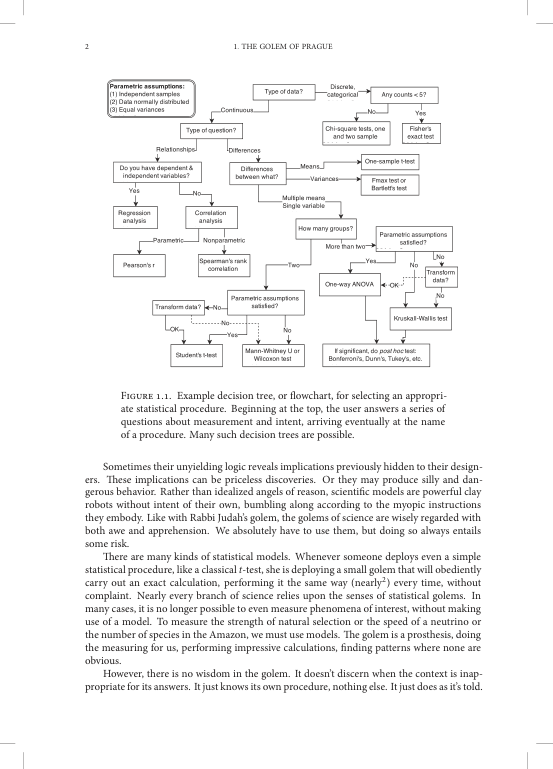

In [59]:
path = "../RM-StatRethink-Bayes.pdf"
doc = pymupdf.open(path)
page_test = doc[15] 
page = page_test.get_pixmap().save("page.png")
Image("page.png")

In [69]:
def get_page_text(doc, page_number: int, title_header: str) -> str:
    page_test = doc[page_number] 
    page_test_text = page_test.get_text()
    return page_test_text.split(title_header)[1].strip('\n').replace('-\n', '').replace('\n', ' ')

In [71]:
test_text = get_page_text(doc, 15, "THE GOLEM OF PRAGUE")

In [36]:
chapters

[Chapter(chapter_number=3, chapter_title_header='3. SAMPLING THE IMAGINARY', chapter_title_footer='', chapter_start_page=62, chapter_end_page=81)]

In [72]:
test_text

'Figure 1.1. Example decision tree, or flowchart, for selecting an appropriate statistical procedure. Beginning at the top, the user answers a series of questions about measurement and intent, arriving eventually at the name of a procedure. Many such decision trees are possible. Sometimes their unyielding logic reveals implications previously hidden to their designers. These implications can be priceless discoveries. Or they may produce silly and dangerous behavior. Rather than idealized angels of reason, scientific models are powerful clay robots without intent of their own, bumbling along according to the myopic instructions they embody. Like with Rabbi Judah’s golem, the golems of science are wisely regarded with both awe and apprehension. We absolutely have to use them, but doing so always entails some risk. There are many kinds of statistical models. Whenever someone deploys even a simple statistical procedure, like a classical t-test, she is deploying a small golem that will obed

In [74]:
full_page_tts = tts.tts_to_file(text=test_text,
                                file_path="test.wav",
                                speaker_wav="run_tts/speaker-longer-enhanced-90p.wav",
                                language="en")
Audio(full_page_tts, rate=AUDIO_RATE)

 > Text splitted to sentences.
['Figure 1.1.', 'Example decision tree, or flowchart, for selecting an appropriate statistical procedure.', 'Beginning at the top, the user answers a series of questions about measurement and intent, arriving eventually at the name of a procedure.', 'Many such decision trees are possible.', 'Sometimes their unyielding logic reveals implications previously hidden to their designers.', 'These implications can be priceless discoveries.', 'Or they may produce silly and dangerous behavior.', 'Rather than idealized angels of reason, scientific models are powerful clay robots without intent of their own, bumbling along according to the myopic instructions they embody.', 'Like with Rabbi Judah’s golem, the golems of science are wisely regarded with both awe and apprehension.', 'We absolutely have to use them, but doing so always entails some risk.', 'There are many kinds of statistical models.', 'Whenever someone deploys even a simple statistical procedure, like 

In [75]:
%%writefile run_tts/entrypoint.py
import modal
import os
import shutil
from audiobook import setup_tts
import pymupdf
app = modal.App("")
image = (
    modal.Image
    .debian_slim()
    .apt_install("ffmpeg")
    .pip_install(["pymupdf",
                   "TTS",
                   "torch",
                   "litellm",
                   "pydub",
                   "tqdm"])
)

PAGE_OFFSET = 13

volume = modal.Volume.from_name("model-weights-vol", create_if_missing=True)
MODEL_DIR = "/outputs/models"

@app.function(volumes={MODEL_DIR: volume}, image=image)
def do_tts(text: str, chapter_number: int, page_number: int, speaker_wav: str = "/mount/speaker-longer-enhanced-90p.wav") -> str:
    tts = setup_tts()
    file_path = f"outputs/chapter_{chapter_number}/{page_number}.wav"
    return tts.tts_to_file(text=text, speaker_wav=speaker_wav, language="en")

def get_page_text(doc, page_number: int, title_header: str) -> str:
    page_test = doc[page_number] 
    page_test_text = page_test.get_text()
    return page_test_text.split(title_header)[1].strip('\n').replace('-\n', '').replace('\n', ' ')

@app.local_entrypoint()
def launch_modal():
    path = "../RM-StatRethink-Bayes.pdf"
    chapters = load_chapters_from_yaml("chapters.yaml")
    doc = pymupdf.open(path)
    inputs_list = []
    for chapter in tqdm(chapters[0:5]):
        os.makedirs(f"outputs/chapter_{chapter['chapter_number']}", exist_ok=True)
        for page_number in range(chapter["start"] + PAGE_OFFSET, chapter["end"] + PAGE_OFFSET):
            page_text = get_page_text(doc, page_number, chapter["title"])
            inputs_list.append((page_text, chapter["chapter_number"], page_number))

    do_tts.starmap(inputs_list)
    
if __name__ == "__main__":
    launch_modal()

Overwriting run_tts/entrypoint.py


1. GPU (cuda) runs:

0.24 seconds per character

0.32 seconds per character

0.36 seconds per character

0.31 seconds per character (twice)

CPU run:

0.76 seconds per character

In [17]:
cost_per_character_gpu = 0.000164 * 0.3
cost_per_character_cpu = 0.000038 * 0.7
print(f"Cost per 1000 characters on GPU: {1000*cost_per_character_gpu:.2f} USD")
print(f"Cost per 1000 characters on CPU: {1000*cost_per_character_cpu:.2f} USD")

Cost per 1000 characters on GPU: 0.05 USD
Cost per 1000 characters on CPU: 0.03 USD


In [ ]:
# !rye run modal run run_tts.entrypoint

In [ ]:
# Example usage
text = "Your long text here"
chunks, figures = chunk_text(text, 200, "page.png")
for chunk in chunks:
    print(chunk)

print(figures)

Your long text here
set()


In [ ]:
test_text, test_figure = chunk_text(pg_36.get_text(), 200, page_image="page.png", handle_figures=True)

In [ ]:
test_text

['2.1. THE GARDEN OF FORKING DATA 23 Figure 2.3',
 'Description of 2.3 : The image you shared is titled Figure 2.3 and contains a diagram of the "Garden of Forking Data" as referenced in the surrounding text. The diagram depicts a branching structure',
 'that starts at a single point and then diverges into multiple paths, reminiscent of the layout of a garden with various forking paths. At the top of the diagram, there are a series of circles',
 'representing marbles: two blue and three white in a particular sequence. Below the diagram, there is a table that lists five different conjectures about the contents of a bag, specified by the number',
 'of blue and white marbles. Next to each conjecture is the "Ways to produce" the sequence of blue and white marbles as observed, resulting in a specific number of paths that align with each conjecture.',
 'The passage describes how, after accounting for paths that are inconsistent with the observed sequence of marbles, there are only 3 out of t

In [ ]:
test_text_joined = ' '.join(test_text)
cleaned_text = describe_image("page.png", "", test_text_joined, mode="general_cleanup")

In [ ]:
test_text_joined

'2.1. THE GARDEN OF FORKING DATA 23 Figure 2.3 Description of 2.3 : The image you shared is titled Figure 2.3 and contains a diagram of the "Garden of Forking Data" as referenced in the surrounding text. The diagram depicts a branching structure that starts at a single point and then diverges into multiple paths, reminiscent of the layout of a garden with various forking paths. At the top of the diagram, there are a series of circles representing marbles: two blue and three white in a particular sequence. Below the diagram, there is a table that lists five different conjectures about the contents of a bag, specified by the number of blue and white marbles. Next to each conjecture is the "Ways to produce" the sequence of blue and white marbles as observed, resulting in a specific number of paths that align with each conjecture. The passage describes how, after accounting for paths that are inconsistent with the observed sequence of marbles, there are only 3 out of the 64 paths that rema

In [ ]:
print(cleaned_text)

2.1. THE GARDEN OF FORKING DATA

Figure 2.3. After eliminating paths inconsistent with the observed sequence, only 3 of the 64 paths remain.

The image you shared is titled Figure 2.3 and contains a diagram of the "Garden of Forking Data" as referenced in the surrounding text. The diagram depicts a branching structure that starts at a single point and then diverges into multiple paths, reminiscent of the layout of a garden with various forking paths. At the top of the diagram, there are a series of circles representing marbles: two blue and three white in a particular sequence. Below the diagram, there is a table that lists five different conjectures about the contents of a bag, specified by the number of blue and white marbles. Next to each conjecture is the "Ways to produce" the sequence of blue and white marbles as observed, resulting in a specific number of paths that align with each conjecture.

The passage continues: 

Now we count up all the ways each conjecture could produce th

In [ ]:
# len(doc)
doc = fitz.open('mount/book.pdf')


NameError: name 'fitz' is not defined

In [ ]:
def make_transcriptions(path, tts, page_start=0, page_end=1):
    doc = fitz.open(path)
    for index, page in enumerate(doc[page_start:page_end]):
        audio_path = "outputs/pages/{0}".format(index)
        page_path = "outputs/pages/{0}/page.png".format(index)
        if not os.path.exists(audio_path):
            os.makedirs(audio_path)
        page_image = page.get_pixmap().save(page_path)
        initial_text, _figure = chunk_text(page.get_text(), 200, page_image=page_path, handle_figures=True)
        initial_text_joined = ' '.join(initial_text)
        cleaned_text = describe_image(page_path, "", initial_text_joined, mode="general_cleanup")
        final_text_to_write, _figure = chunk_text(cleaned_text, 200, page_image=page_path, handle_figures=False)
        for index, text_chunk in tqdm(enumerate(final_text_to_write)):
            tts.tts_to_file(text=text_chunk,
                            file_path=audio_path + "/{0}.wav".format(index),
                            speaker_wav="speaker-longer-enhanced-90p.wav",
                            language="en")
        concatenate_audio_pydub(audio_path, "combined.wav")

In [ ]:
# this equals about 24 hours in CPU time, which isn't terrible I guess.
#Should look into huggingface native for actual GPU support.

In [ ]:
# Example usage
concatenate_audio_pydub("outputs/pages/36/", "combined_audio.wav")

Reading audio files: 100%|██████████| 18/18 [00:00<00:00, 1988.35it/s]
